## Kunaal Naik Youtube channel Analysis dataset information
### No of datasets:
#### 1. YT_KN_Ad_Type.csv: Advertisements analysis
#### 2. YT_KN_Date.csv: Views per date day/month/year
#### 3. YT_KN_Device_Type.csv: Devices used to view the videos
#### 4. YT_KN_Geography.csv: Geographic loactions to view the videos 
#### 5. YT_KN_Playlist.csv: Playlist details
#### 6. YT_KN_Revenue_Source.csv: Revenue earning dataset
#### 7. YT_KN_Sharing_Service.csv: Sharing service dataset
#### 8. YT_KN_Subscription_Source.csv: Subscription source dataset
#### 9. YT_KN_Subscription_Status.csv:  Subscription status (whether subscribed or not)
#### 10. YT_KN_Traffic_Source.csv: Channel's traffic analysis
#### 11. YT_KN_Video.csv: Video data
#### 12. YT_KN_Viewer_Age.csv: Age groups of people who view the channel
#### 13. YT_KN_Viewer_Gender.csv: Number of male and female persons who view the channel

## Importing the libraries

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from warnings import filterwarnings
filterwarnings("ignore")

### Analysis of Revenue sources dataset

In [3]:
data_revenue = pd.read_csv("Datasets/YT_KN_Revenue_Source.csv")
data_revenue.head()

,Date,Revenue source,Your estimated revenue (INR)
0,2012-01-06,ADS,0.0
1,2012-01-07,ADS,0.0
2,2012-01-08,ADS,0.0
3,2012-01-09,ADS,0.0
4,2012-01-10,ADS,0.0


In [4]:
data_revenue.tail()

,Date,Revenue source,Your estimated revenue (INR)
6191,2020-06-25,YOUTUBE_RED,0.0
6192,2020-06-26,YOUTUBE_RED,0.0
6193,2020-06-27,YOUTUBE_RED,0.0
6194,2020-06-28,YOUTUBE_RED,0.0
6195,2020-06-29,YOUTUBE_RED,0.0


In [5]:
data_revenue.shape

(6196, 3)

In [6]:
data_revenue.columns

Index(['Date', 'Revenue source', 'Your estimated revenue (INR)'], dtype='object')

In [7]:
data_revenue.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6196 entries, 0 to 6195
Data columns (total 3 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Date                          6196 non-null   object 
 1   Revenue source                6196 non-null   object 
 2   Your estimated revenue (INR)  6196 non-null   float64
dtypes: float64(1), object(2)
memory usage: 145.3+ KB


In [8]:
data_revenue.describe()

,Your estimated revenue (INR)
count,6196.000000
mean,3.012161
std,7.127896
min,0.000000
25%,0.000000
50%,0.000000
75%,1.204250
max,135.038000


In [9]:
from pandas_profiling import ProfileReport

### Generating the report of the revenue dataset

In [10]:
revenue_report = ProfileReport(
    data_revenue,
    title="Revenue Data for YT channel analysis"                      
)
revenue_report.to_notebook_iframe()
revenue_report.to_file("Revenue_report_YT.html")

In [11]:
data_revenue.nunique()

Date                            3098
Revenue_source                     2
Your_estimated_revenue_(INR)    1788
dtype: int64

In [12]:
def change_to_date_time(cols):
    data_revenue[cols] = pd.to_datetime(data_revenue[cols])

In [13]:
change_to_date_time("Date")

In [14]:
data_revenue.dtypes

Date                            datetime64[ns]
Revenue_source                          object
Your_estimated_revenue_(INR)           float64
dtype: object

In [15]:
data_revenue["Day"] = data_revenue["Date"].dt.day
data_revenue["Month"] = data_revenue["Date"].dt.month
data_revenue["Year"] = data_revenue["Date"].dt.year

In [16]:
data_revenue.head()

,Date,Revenue_source,Your_estimated_revenue_(INR),Day,Month,Year
0,2012-01-06,ADS,0.0,6,1,2012
1,2012-01-07,ADS,0.0,7,1,2012
2,2012-01-08,ADS,0.0,8,1,2012
3,2012-01-09,ADS,0.0,9,1,2012
4,2012-01-10,ADS,0.0,10,1,2012


In [17]:
data_revenue.drop("Date", axis = 1, inplace = True)

In [18]:
data_revenue.head()

,Revenue_source,Your_estimated_revenue_(INR),Day,Month,Year
0,ADS,0.0,6,1,2012
1,ADS,0.0,7,1,2012
2,ADS,0.0,8,1,2012
3,ADS,0.0,9,1,2012
4,ADS,0.0,10,1,2012


In [19]:
data_revenue.isna().sum()

Revenue_source                  0
Your_estimated_revenue_(INR)    0
Day                             0
Month                           0
Year                            0
dtype: int64

#### Average earnings per month 

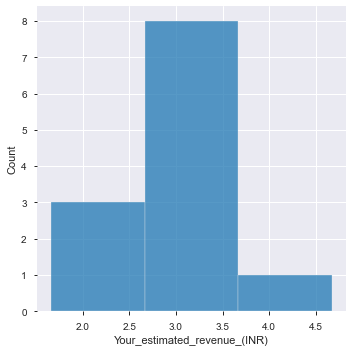

In [20]:
sns.displot(data_revenue.groupby(["Month"])["Your_estimated_revenue_(INR)"].mean(), discrete = True)

### Traffic dataset Analysis

In [21]:
data_traffic = pd.read_csv("Datasets/YT_KN_Traffic_Source.csv")
data_traffic.head()

,Date,Traffic source,Views
0,2012-01-06,UNKNOWN_MOBILE_OR_DIRECT,0
1,2012-01-07,UNKNOWN_MOBILE_OR_DIRECT,0
2,2012-01-08,UNKNOWN_MOBILE_OR_DIRECT,0
3,2012-01-09,UNKNOWN_MOBILE_OR_DIRECT,0
4,2012-01-10,UNKNOWN_MOBILE_OR_DIRECT,0


In [22]:
data_traffic.shape

(52666, 3)

In [23]:
data_traffic.tail()

,Date,Traffic source,Views
52661,2020-06-25,END_SCREEN,1
52662,2020-06-26,END_SCREEN,2
52663,2020-06-27,END_SCREEN,0
52664,2020-06-28,END_SCREEN,0
52665,2020-06-29,END_SCREEN,1


In [24]:
data_traffic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52666 entries, 0 to 52665
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            52666 non-null  object
 1   Traffic source  52666 non-null  object
 2   Views           52666 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.2+ MB


In [25]:
data_traffic.describe()

,Views
count,52666.000000
mean,4.979152
std,14.197635
min,0.000000
25%,0.000000
50%,0.000000
75%,3.000000
max,359.000000


In [26]:
data_traffic['Date'] = pd.to_datetime(data_traffic["Date"])
data_traffic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52666 entries, 0 to 52665
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            52666 non-null  datetime64[ns]
 1   Traffic source  52666 non-null  object        
 2   Views           52666 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 1.2+ MB


In [27]:
data_traffic["Day"] = data_traffic["Date"].dt.day
data_traffic["Month"] = data_traffic["Date"].dt.month
data_traffic["Year"] = data_traffic["Date"].dt.year

In [28]:
data_traffic.drop("Date", axis = 1, inplace = True)

In [29]:
data_traffic.head()

,Traffic source,Views,Day,Month,Year
0,UNKNOWN_MOBILE_OR_DIRECT,0,6,1,2012
1,UNKNOWN_MOBILE_OR_DIRECT,0,7,1,2012
2,UNKNOWN_MOBILE_OR_DIRECT,0,8,1,2012
3,UNKNOWN_MOBILE_OR_DIRECT,0,9,1,2012
4,UNKNOWN_MOBILE_OR_DIRECT,0,10,1,2012


### Views per month distribution

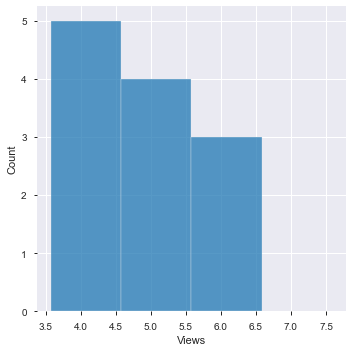

In [30]:
sns.displot(data_traffic.groupby(["Month"])["Views"].mean(), discrete = True)

### Generating the analysis report of the dataset

In [31]:
traffic_report = ProfileReport(
    data_traffic,
    title="Traffic Analysis Data for YT channel analysis",
)
traffic_report.to_notebook_iframe()
traffic_report.to_file("Traffic_report_YT.html")

In [32]:
data_traffic.isna().sum()

Traffic_source    0
Views             0
Day               0
Month             0
Year              0
dtype: int64

## Videos dataset analysis

In [33]:
data_video = pd.read_csv("Datasets/YT_KN_Video.csv")
data_video.head()

,Date,Video,Video title,Video publish time,Views
0,2012-01-06,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0
1,2012-01-07,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0
2,2012-01-08,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0
3,2012-01-09,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0
4,2012-01-10,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0


In [34]:
data_video.columns

Index(['Date', 'Video', 'Video title', 'Video publish time', 'Views'], dtype='object')

In [35]:
data_video.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15490 entries, 0 to 15489
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Date                15490 non-null  object
 1   Video               15490 non-null  object
 2   Video title         15490 non-null  object
 3   Video publish time  15490 non-null  object
 4   Views               15490 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 605.2+ KB


In [36]:
data_video.tail()

,Date,Video,Video title,Video publish time,Views
15485,2020-06-25,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",29
15486,2020-06-26,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",28
15487,2020-06-27,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",18
15488,2020-06-28,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",19
15489,2020-06-29,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",35


In [37]:
data_video["Date"] = pd.to_datetime(data_video["Date"])
data_video.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15490 entries, 0 to 15489
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                15490 non-null  datetime64[ns]
 1   Video               15490 non-null  object        
 2   Video title         15490 non-null  object        
 3   Video publish time  15490 non-null  object        
 4   Views               15490 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 605.2+ KB


In [38]:
data_video.isna().sum()

Date                  0
Video                 0
Video title           0
Video publish time    0
Views                 0
dtype: int64

In [39]:
data_video["Day"] = data_video["Date"].dt.day
data_video["Month"] = data_video["Date"].dt.month
data_video["Year"] = data_video["Date"].dt.year

In [40]:
data_video.drop('Date', axis = 1, inplace = True)

In [41]:
data_video.head()

,Video,Video title,Video publish time,Views,Day,Month,Year
0,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0,6,1,2012
1,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0,7,1,2012
2,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0,8,1,2012
3,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0,9,1,2012
4,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,"Aug 5, 2012",0,10,1,2012


In [42]:
data_video.tail()

,Video,Video title,Video publish time,Views,Day,Month,Year
15485,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",29,25,6,2020
15486,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",28,26,6,2020
15487,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",18,27,6,2020
15488,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",19,28,6,2020
15489,paxVLS9n4Sg,How to Do a VLOOKUP in Excel #9 : Duplicate VL...,"Jun 12, 2016",35,29,6,2020


In [43]:
data_video['Video publish time'] = pd.to_datetime(data_video["Video publish time"])

In [44]:
data_video["publish_day"] = data_video["Video publish time"].dt.day
data_video["publish_month"] = data_video["Video publish time"].dt.month
data_video["publish_year"] = data_video["Video publish time"].dt.year

In [45]:
data_video.drop('Video publish time', axis = 1, inplace = True)

In [46]:
data_video.head()

,Video,Video title,Views,Day,Month,Year,publish_day,publish_month,publish_year
0,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,0,6,1,2012,5,8,2012
1,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,0,7,1,2012,5,8,2012
2,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,0,8,1,2012,5,8,2012
3,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,0,9,1,2012,5,8,2012
4,BU9TyQWFmF8,#5 - Finalizing Dashboard | Human Resource Das...,0,10,1,2012,5,8,2012


#### Vies per month distribution for the videos

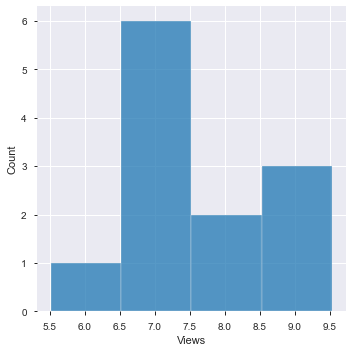

In [47]:
sns.displot(data_video.groupby(['Month'])['Views'].mean(), discrete = True)

#### Views at the time of publishing month

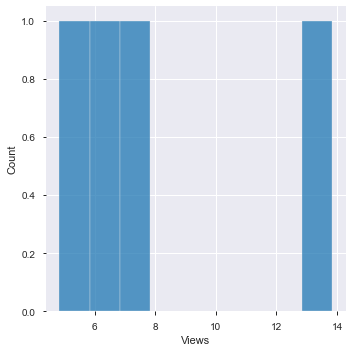

In [48]:
sns.displot(data_video.groupby(['publish_month'])['Views'].mean(), discrete = True)

#### Generating an analysis report of the videos dataset

In [49]:
video_report = ProfileReport(
    data_video,
    title="Video Data for YT channel analysis",
)
video_report.to_notebook_iframe()
video_report.to_file("Video_report_YT.html")

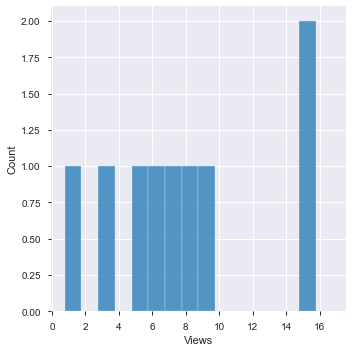

In [50]:
sns.displot(data_video.groupby(['Year'])['Views'].mean(), discrete = True)

## The Viewer age dataset analysis

In [51]:
viewer_data_age = pd.read_csv("Datasets/YT_KN_Viewer_Age.csv")
viewer_data_age.head()

,Viewer age,Views (%),Average view duration,Average percentage viewed (%),Watch time (hours) (%)
0,AGE_18_24,15.30,0:02:11,22.65,17.38
1,AGE_25_34,74.64,0:01:51,38.23,71.90
2,AGE_35_44,8.97,0:02:06,42.20,9.83
3,AGE_45_54,0.94,0:01:33,27.03,0.76
4,AGE_55_64,0.07,0:01:37,37.45,0.06


In [52]:
viewer_data_age.shape

(6, 5)

In [53]:
viewer_data_age.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Viewer age                     6 non-null      object 
 1   Views (%)                      6 non-null      float64
 2   Average view duration          6 non-null      object 
 3   Average percentage viewed (%)  6 non-null      float64
 4   Watch time (hours) (%)         6 non-null      float64
dtypes: float64(3), object(2)
memory usage: 368.0+ bytes


In [54]:
viewer_data_age['Average view duration'] = pd.to_datetime(viewer_data_age["Average view duration"])
viewer_data_age.dtypes

Viewer age                               object
Views (%)                               float64
Average view duration            datetime64[ns]
Average percentage viewed (%)           float64
Watch time (hours) (%)                  float64
dtype: object

In [55]:
viewer_data_age['hours'] = viewer_data_age['Average view duration'].dt.hour
viewer_data_age['minutes'] = viewer_data_age['Average view duration'].dt.minute


In [56]:
viewer_data_age.drop('Average view duration', axis = 1, inplace = True)

In [57]:
viewer_data_age.head()

,Viewer age,Views (%),Average percentage viewed (%),Watch time (hours) (%),hours,minutes
0,AGE_18_24,15.30,22.65,17.38,0,2
1,AGE_25_34,74.64,38.23,71.90,0,1
2,AGE_35_44,8.97,42.20,9.83,0,2
3,AGE_45_54,0.94,27.03,0.76,0,1
4,AGE_55_64,0.07,37.45,0.06,0,1


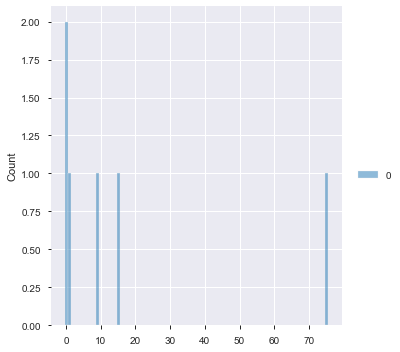

In [58]:
sns.displot(viewer_data_age.groupby(['Views (%)'])['hours'], discrete = True)

In [59]:
viewer_data_age.head(10)

,Viewer age,Views (%),Average percentage viewed (%),Watch time (hours) (%),hours,minutes
0,AGE_18_24,15.30,22.65,17.38,0,2
1,AGE_25_34,74.64,38.23,71.90,0,1
2,AGE_35_44,8.97,42.20,9.83,0,2
3,AGE_45_54,0.94,27.03,0.76,0,1
4,AGE_55_64,0.07,37.45,0.06,0,1
5,AGE_65_,0.08,54.73,0.07,0,1


In [60]:
age_range = list(viewer_data_age['Viewer age'])
age_range

['AGE_18_24', 'AGE_25_34', 'AGE_35_44', 'AGE_45_54', 'AGE_55_64', 'AGE_65_']

### Age groups view counts for the channel

([<matplotlib.patches.Wedge at 0x224b6d2c9a0>,
 [Text(1.1526947378133146, 0.6010780659926745, 'AGE_18_24'),
  Text(-1.085128905999833, -0.1802644095866007, 'AGE_25_34'),
  Text(1.4089108859502661, -0.5147524797908569, 'AGE_35_44'),
  Text(1.1990895655858897, -0.04673557213774326, 'AGE_45_54'),
  Text(1.299966059594945, -0.009393822501647303, 'AGE_55_64'),
  Text(1.3999955769507197, -0.0035191644494179243, 'AGE_65_')])

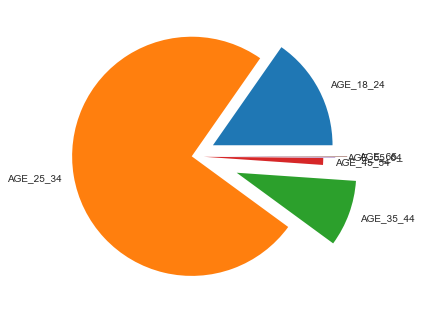

In [61]:
myexplode = [0.2, 0, 0.4,  0.1, 0.2, 0.3]
plt.pie(viewer_data_age['Views (%)'], labels = age_range, explode = myexplode)

## Gender dataset analysis

In [62]:
viewer_gender_data = pd.read_csv("Datasets/YT_KN_Viewer_Gender.csv")
viewer_gender_data.head()

,Viewer gender,Views (%),Average view duration,Average percentage viewed (%),Watch time (hours) (%)
0,FEMALE,20.65,0:02:00,34.85,21.41
1,MALE,79.35,0:01:55,35.35,78.59


### Generating the report of the gender dataset

In [63]:
viewer_gender_report = ProfileReport(
    viewer_gender_data,
    title="Gender of viewers Data for YT channel analysis",
)
viewer_gender_report.to_notebook_iframe()
viewer_gender_report.to_file("Viewer's_Gender_YT.html")

In [64]:
viewer_gender_data.describe()

,Views_(%),Average_percentage_viewed_(%),Watch_time_(hours)_(%)
count,2.000000,2.000000,2.000000
mean,50.000000,35.100000,50.000000
std,41.507168,0.353553,40.432366
min,20.650000,34.850000,21.410000
25%,35.325000,34.975000,35.705000
50%,50.000000,35.100000,50.000000
75%,64.675000,35.225000,64.295000
max,79.350000,35.350000,78.590000


## The Dates dataset analysis

In [65]:
date_data = pd.read_csv("Datasets/YT_KN_Date.csv")
date_data.head()

,Date,Views,Watch time (hours),Average view duration,Your estimated revenue (INR)
0,Total,262232.0,9134.4712,0:02:05,18663.363
1,2020-06-29,405.0,11.6056,0:01:43,0.000
2,2020-06-28,288.0,8.0885,0:01:41,0.000
3,2020-06-27,247.0,7.0103,0:01:42,0.000
4,2020-06-26,330.0,8.8471,0:01:36,0.000


In [66]:
date_data.tail()

,Date,Views,Watch time (hours),Average view duration,Your estimated revenue (INR)
497,2019-02-19,118.0,3.5947,0:01:49,0.0
498,2019-02-18,121.0,4.1067,0:02:02,0.0
499,2019-02-17,75.0,2.1808,0:01:44,0.0
500,2019-02-16,60.0,1.8216,0:01:49,0.0
501,Showing top 500 results,NaN,NaN,NaN,NaN


In [67]:
date_data.isna().sum()

Date                            0
Views                           1
Watch time (hours)              1
Average view duration           1
Your estimated revenue (INR)    1
dtype: int64

In [68]:
date_data.dropna()

,Date,Views,Watch time (hours),Average view duration,Your estimated revenue (INR)
0,Total,262232.0,9134.4712,0:02:05,18663.363
1,2020-06-29,405.0,11.6056,0:01:43,0.000
2,2020-06-28,288.0,8.0885,0:01:41,0.000
3,2020-06-27,247.0,7.0103,0:01:42,0.000
4,2020-06-26,330.0,8.8471,0:01:36,0.000
...,...,...,...,...,...
496,2019-02-20,153.0,4.4115,0:01:43,0.000
497,2019-02-19,118.0,3.5947,0:01:49,0.000
498,2019-02-18,121.0,4.1067,0:02:02,0.000
499,2019-02-17,75.0,2.1808,0:01:44,0.000


### Data filtering

In [69]:
date_data = date_data.iloc[1:, :] # removing the top row as we do not need the total count for now
date_data.head()

,Date,Views,Watch time (hours),Average view duration,Your estimated revenue (INR)
1,2020-06-29,405.0,11.6056,0:01:43,0.0
2,2020-06-28,288.0,8.0885,0:01:41,0.0
3,2020-06-27,247.0,7.0103,0:01:42,0.0
4,2020-06-26,330.0,8.8471,0:01:36,0.0
5,2020-06-25,528.0,16.5010,0:01:52,0.0


In [70]:
date_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 501 entries, 1 to 501
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Date                          501 non-null    object 
 1   Views                         500 non-null    float64
 2   Watch time (hours)            500 non-null    float64
 3   Average view duration         500 non-null    object 
 4   Your estimated revenue (INR)  500 non-null    float64
dtypes: float64(3), object(2)
memory usage: 19.7+ KB


In [71]:
date_data.describe()

,Views,Watch time (hours),Your estimated revenue (INR)
count,500.000000,500.000000,500.000000
mean,170.660000,5.591998,0.000002
std,107.876035,5.621179,0.000045
min,43.000000,1.048200,0.000000
25%,102.000000,3.057100,0.000000
50%,132.500000,4.218650,0.000000
75%,198.250000,6.358425,0.000000
max,620.000000,84.095200,0.001000


In [72]:
date_data = date_data.iloc[:-1 , :]
date_data

,Date,Views,Watch time (hours),Average view duration,Your estimated revenue (INR)
1,2020-06-29,405.0,11.6056,0:01:43,0.0
2,2020-06-28,288.0,8.0885,0:01:41,0.0
3,2020-06-27,247.0,7.0103,0:01:42,0.0
4,2020-06-26,330.0,8.8471,0:01:36,0.0
5,2020-06-25,528.0,16.5010,0:01:52,0.0
...,...,...,...,...,...
496,2019-02-20,153.0,4.4115,0:01:43,0.0
497,2019-02-19,118.0,3.5947,0:01:49,0.0
498,2019-02-18,121.0,4.1067,0:02:02,0.0
499,2019-02-17,75.0,2.1808,0:01:44,0.0


### Converting to datetime

In [73]:
date_data["Date"] = pd.to_datetime(date_data['Date'])

In [74]:
date_data.dtypes

Date                            datetime64[ns]
Views                                  float64
Watch time (hours)                     float64
Average view duration                   object
Your estimated revenue (INR)           float64
dtype: object

#### Extracting the day, month, year

In [75]:
date_data['Day'] = date_data["Date"].dt.day
date_data['Month'] = date_data["Date"].dt.month
date_data['Year'] = date_data["Date"].dt.year


In [76]:
date_data.drop("Date", axis = 1, inplace = True)

In [77]:
date_data.head()

,Views,Watch time (hours),Average view duration,Your estimated revenue (INR),Day,Month,Year
1,405.0,11.6056,0:01:43,0.0,29,6,2020
2,288.0,8.0885,0:01:41,0.0,28,6,2020
3,247.0,7.0103,0:01:42,0.0,27,6,2020
4,330.0,8.8471,0:01:36,0.0,26,6,2020
5,528.0,16.5010,0:01:52,0.0,25,6,2020


In [78]:
date_data['avg_view_time'] = pd.to_datetime(date_data['Average view duration'])

In [79]:
date_data['avg_hours'] = date_data['avg_view_time'].dt.hour
date_data['avg_minutes'] = date_data['avg_view_time'].dt.minute


In [80]:
date_data.drop('Average view duration', axis = 1, inplace = True)

In [81]:
date_data.head()

,Views,Watch time (hours),Your estimated revenue (INR),Day,Month,Year,avg_view_time,avg_hours,avg_minutes
1,405.0,11.6056,0.0,29,6,2020,2022-07-23 00:01:43,0,1
2,288.0,8.0885,0.0,28,6,2020,2022-07-23 00:01:41,0,1
3,247.0,7.0103,0.0,27,6,2020,2022-07-23 00:01:42,0,1
4,330.0,8.8471,0.0,26,6,2020,2022-07-23 00:01:36,0,1
5,528.0,16.5010,0.0,25,6,2020,2022-07-23 00:01:52,0,1


In [82]:
date_data.drop('avg_view_time', axis = 1, inplace = True)

In [83]:
date_data.head()

,Views,Watch time (hours),Your estimated revenue (INR),Day,Month,Year,avg_hours,avg_minutes
1,405.0,11.6056,0.0,29,6,2020,0,1
2,288.0,8.0885,0.0,28,6,2020,0,1
3,247.0,7.0103,0.0,27,6,2020,0,1
4,330.0,8.8471,0.0,26,6,2020,0,1
5,528.0,16.5010,0.0,25,6,2020,0,1


In [84]:
date_data.tail()

,Views,Watch time (hours),Your estimated revenue (INR),Day,Month,Year,avg_hours,avg_minutes
496,153.0,4.4115,0.0,20,2,2019,0,1
497,118.0,3.5947,0.0,19,2,2019,0,1
498,121.0,4.1067,0.0,18,2,2019,0,2
499,75.0,2.1808,0.0,17,2,2019,0,1
500,60.0,1.8216,0.0,16,2,2019,0,1


### Watching time distribution per day

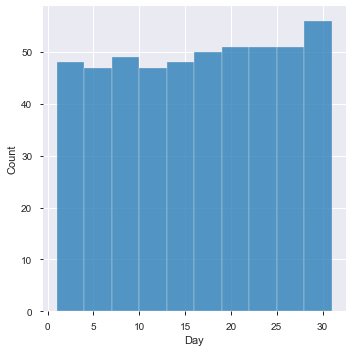

In [85]:
sns.displot(date_data.groupby(['Watch time (hours)'])['Day'].mean())

In [86]:
date_data.drop('avg_hours', axis = 1, inplace = True)

In [87]:
date_data.head()

,Views,Watch time (hours),Your estimated revenue (INR),Day,Month,Year,avg_minutes
1,405.0,11.6056,0.0,29,6,2020,1
2,288.0,8.0885,0.0,28,6,2020,1
3,247.0,7.0103,0.0,27,6,2020,1
4,330.0,8.8471,0.0,26,6,2020,1
5,528.0,16.5010,0.0,25,6,2020,1


In [88]:
date_report = ProfileReport(
    date_data,
    title="Views per date for YT channel analysis",                    
)
date_report.to_notebook_iframe()
date_report.to_file("Date Report_YT.html")

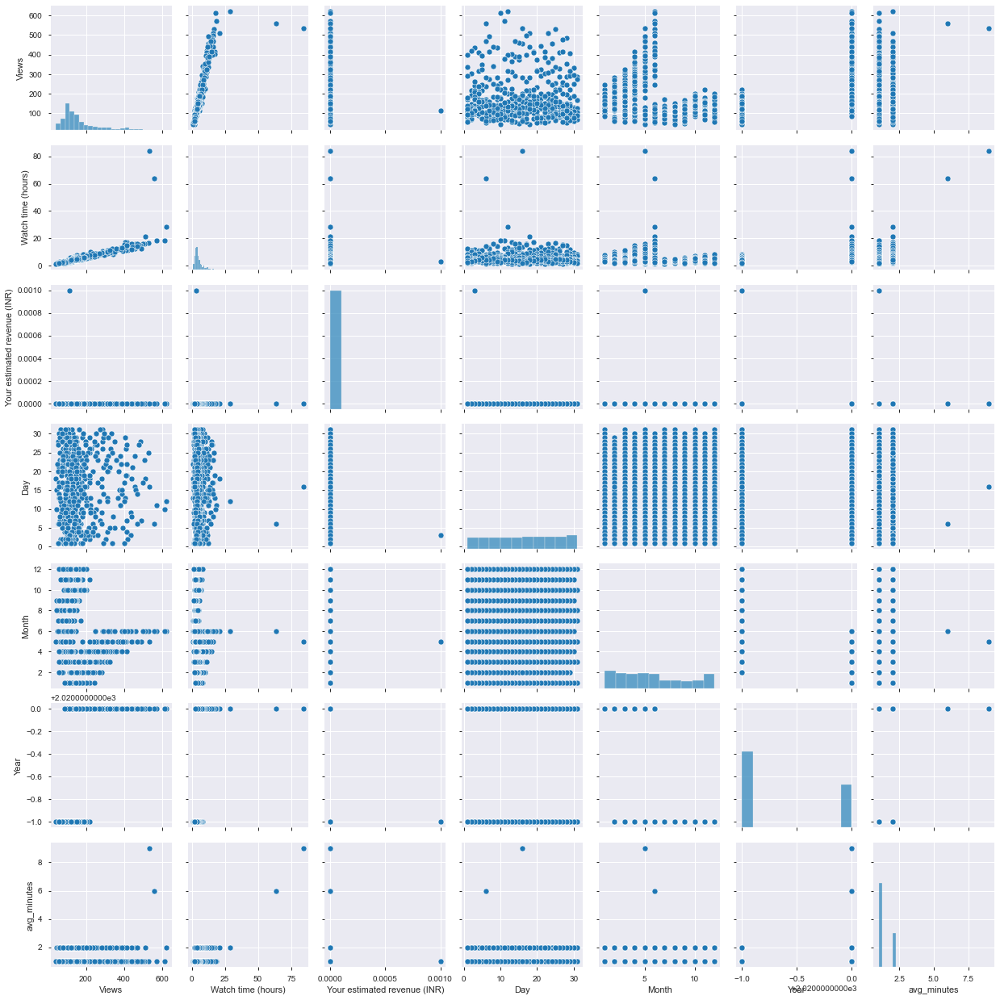

In [89]:
sns.pairplot(date_data)

In [90]:
def plot(df, col):
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1)
    sns.distplot(df[col], ax = ax1)
    sns.boxplot(df[col], ax = ax2)
    sns.histplot(df[col], ax = ax3)

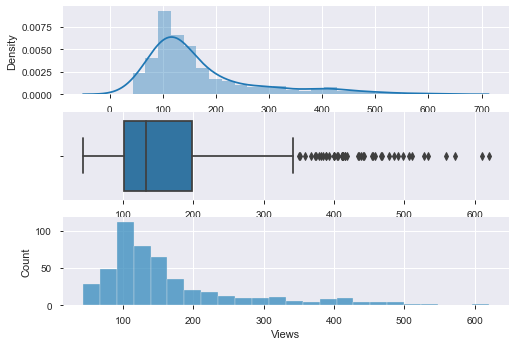

In [91]:

plot(date_data, 'Views')

In [92]:
date_data['Views'] = np.where(date_data['Views'] >= 500, date_data['Views'].median(), date_data['Views'])

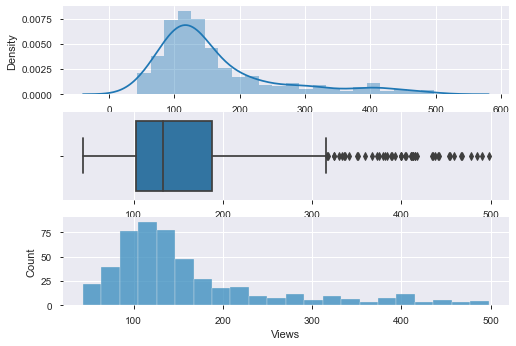

In [93]:
plot(date_data, 'Views')

## The Geographic location dataset

In [94]:
location_data = pd.read_csv("Datasets/YT_KN_Geography.csv")
location_data.head()

,Date,Geography,Views
0,2012-01-06,AE,0
1,2012-01-07,AE,0
2,2012-01-08,AE,0
3,2012-01-09,AE,0
4,2012-01-10,AE,0


In [95]:
location_data.shape

(322192, 3)

In [96]:
location_data['Geography'].nunique()

103

In [97]:
location_data.isna().sum()

Date            0
Geography    3098
Views           0
dtype: int64

In [98]:
location_data.dropna()

,Date,Geography,Views
0,2012-01-06,AE,0
1,2012-01-07,AE,0
2,2012-01-08,AE,0
3,2012-01-09,AE,0
4,2012-01-10,AE,0
...,...,...,...
322187,2020-06-25,ZW,0
322188,2020-06-26,ZW,0
322189,2020-06-27,ZW,0
322190,2020-06-28,ZW,0


In [99]:
location_names = list(set(list(location_data['Geography'])))
len(location_names)

104

In [100]:
location_data.groupby(['Geography'])['Views'].mean()

Geography
AE     0.231762
AF     0.005810
AU     0.126856
AW     0.004842
AZ     0.003228
        ...    
US    14.328599
VE     0.003873
VN     0.048741
ZA     0.057456
ZW     0.003228
Name: Views, Length: 103, dtype: float64

In [101]:
location_data_report = ProfileReport(
    location_data,
    title="Location Data for YT channel analysis",
)
location_data_report.to_notebook_iframe()
location_data_report.to_file("Location_Data_YT.html")

## A ML implementation of Linear Regression, Random Forest Regressor on date_data for the number of views (a predictive analysis approach)

In [102]:
date_data.drop('Year', axis = 1, inplace = True)

In [103]:
x = date_data.drop('Views', axis = 1)

In [104]:
y = date_data['Views']

In [105]:
y

1      405.0
2      288.0
3      247.0
4      330.0
5      132.5
       ...  
496    153.0
497    118.0
498    121.0
499     75.0
500     60.0
Name: Views, Length: 500, dtype: float64

In [106]:
x

,Watch time (hours),Your estimated revenue (INR),Day,Month,avg_minutes
1,11.6056,0.0,29,6,1
2,8.0885,0.0,28,6,1
3,7.0103,0.0,27,6,1
4,8.8471,0.0,26,6,1
5,16.5010,0.0,25,6,1
...,...,...,...,...,...
496,4.4115,0.0,20,2,1
497,3.5947,0.0,19,2,1
498,4.1067,0.0,18,2,2
499,2.1808,0.0,17,2,1


In [107]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [108]:
import pickle

In [109]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.5)

In [110]:
def predict(ml_model, dump):
    model = ml_model.fit(X_train,y_train)
    print('Training score : {}'.format(model.score(X_train,y_train)))
    y_prediction = model.predict(X_test)
    
    print('predictions are: \n {}'.format(y_prediction))
    print('\n')
    
    r2_score = metrics.r2_score(y_test,y_prediction)
    
    print('r2 score: {}'.format(r2_score))
    print('Mean Absolute Error:',metrics.mean_absolute_error(y_test,y_prediction))
    print('Mean Squared Error:',metrics.mean_squared_error(y_test,y_prediction))
    print('Root Mean Squared Error:',np.sqrt(metrics.mean_squared_error(y_test,y_prediction)))
    
    sns.distplot(y_test-y_prediction)
    
    if dump==1:
        ##dump your model using pickle so that we will re-use
        file = open("model.pkl",'wb')
        pickle.dump(model,file)

In [111]:
from sklearn.linear_model import LinearRegression

Training score : 0.44808969727967407
predictions are: 
 [247.49832089 169.11678506 140.32527823 277.90687976 137.50080451
 150.86432022 203.82956794 141.60569797 119.63903142 136.40442202
  96.92322998 120.54872876 226.40161788 166.61845824 149.86489582
 179.08993767 234.47061674 150.12774989  80.80429949 142.35649459
 257.77409521 753.83308654  70.66545024 131.61919797 134.52183279
 207.7646052   84.52314344 264.60078769 139.71952414 131.94559443
 111.24249484 113.39622963 101.58114332 128.14325353 143.4709516
 208.4561435  151.59366443 120.00399917 169.5742564  114.65544661
 286.59977658  92.66092622 141.46823333 138.77070841  95.53331056
 156.66601158 173.24670814 177.84724815 169.5987209  223.64255907
 182.99517429 181.36007425 136.02173278 155.46278223 190.89548937
  63.14390434 126.64070938 118.0230397  141.96646578 237.99545636
 155.15493165 166.73112813 164.31220292 171.02627489 170.53800456
 145.75846669 276.07506316 106.39992791 169.29312993 160.63757112
 150.33706887 293.227

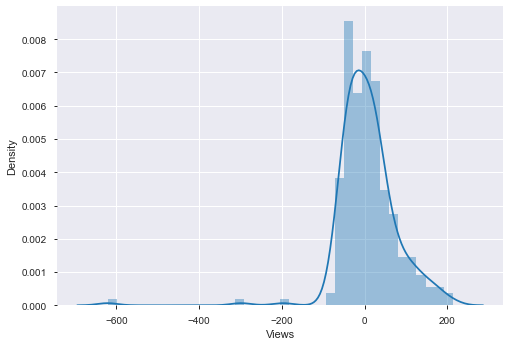

In [112]:
predict(LinearRegression(), 0)

In [113]:
from sklearn.ensemble import RandomForestRegressor

Training score : 0.9872649961729352
predictions are: 
 [309.11  138.45   95.19  408.22  120.94  158.71  208.9   110.52   61.53
  97.55  112.82   89.46  256.67  145.41  116.94  149.04  306.54  115.33
 105.11  109.56  403.45  146.975  93.39   76.38   96.74  254.08   99.12
 398.53  115.91  175.77  131.     61.66  131.99  109.64  110.9   232.1
 151.85  135.63  130.62   70.72  406.22  114.82  116.34   61.7   134.02
 108.71  147.94  159.43  150.49  384.38  270.14  150.24  176.98   99.72
 191.24   66.91  163.42  127.17   95.82  304.06  120.31  158.67  154.7
 154.82  184.89  149.29  400.44  127.89  267.23  232.38  109.74  439.94
  94.53  117.86  260.83  188.21   93.14  109.25  123.86  204.49  145.23
  84.44  145.55  147.79  394.17  134.21  361.62  293.75  113.2   121.66
 234.48  356.89  192.27  123.46   99.49  108.94  232.91  434.74  144.04
  61.41  209.52  187.03   95.02  111.49  131.    396.65   90.46  179.6
 135.32  101.9   115.4   114.71   69.5   197.74  255.39  238.63  158.845
 401.32  28

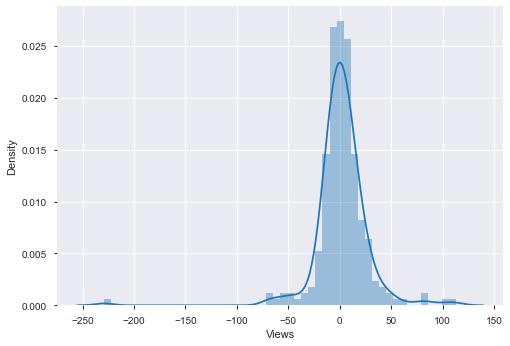

In [114]:
predict(RandomForestRegressor(), 1)

### Estimated views per month

In [ ]:
predict(DecisionTreeRegressor(), 0)